In [1]:
from IPython.core.display import HTML
def css_styling():
    styles = open("./styles/custom.css", "r").read()
    return HTML(styles)
css_styling()

# Ecuación de difusión en 1D

La ecuación de difusión en una dimensión es la siguiente

$$\frac{\partial u}{\partial t} = \nu \frac{\partial^2 u}{\partial x^2}$$

Lo nuevo de esta ecuación es que es una ecuación de segundo orden en el espacio.

Ahora tenemos que discretizar la ecuación usando diferencias finitas.

Tenemos que discretizar $\frac{\partial^2 u}{\partial x^2}$
 
Esto se puede hacer tomando la primera derivada parcial hacia adelante $\left(\frac{\partial u}{\partial x} \approx \frac{u_{i+1}^n-u_i^n}{\Delta x}\right)$ y la segunda hacia atras $\left(\frac{\partial u}{\partial x} \approx \frac{u_{i}^n-u_{i-1}^n}{\Delta x}\right)$ 

De donde obtenemos $$\frac{\partial^2 u}{\partial x^2} \approx \frac{u_{i+1}^n+u_{i-1}^n-2u_i^n}{\left(\Delta x\right)^2}$$

Por lo tanto si discretizamos la ecuación tenemos

$$\frac{u_i^{n+1}-u_i^n}{\Delta t} =\nu \frac{u_{i+1}^n+u_{i-1}^n-2u_i^n}{\left(\Delta x\right)^2}$$

Por lo que si despuejamos $u_i^{n+1}$ para tener el siguiente paso en el tiempo obtenemos

$$u_i^{n+1} = u_i^n +\frac{\nu \Delta t}{\left(\Delta x\right)^2} \left(u_{i+1}^n+u_{i-1}^n-2u_i^n\right)$$

Por lo tanto si colocamos la misma condición inicial que en los casos anteriores podemos ver el efecto de la segunda derivada espacial sobre el perfil inicial.

In [2]:
#Se importan las librerias necesarias
from numpy import *
from matplotlib.pyplot import *
from matplotlib import animation
from JSAnimation import IPython_display
%matplotlib inline

In [4]:
def avance_en_tiempo(u0, nt, nx, dt, dx, flag=False):
    un = ones(nx)
    if flag: hist=[]
    u = u0
    nu = 1
    for n in range(nt):
        un = u.copy()
        if flag: hist.append(un)
        for i in range(1,nx-1):
            u[i] = un[i]+nu*dt/dx**2*(un[i+1]-2*un[i]+un[i-1])
    if flag:
        return hist
    else:
        return u

A continuación ponemos las condiciones iniciales como una funcion escalon

$$
u_0(x) = 
    \begin{cases} 
    2 & : x \in (0.5,1)\\
    1 & : x \in (0,0.5)\bigcup(1,2)
  \end{cases}
$$

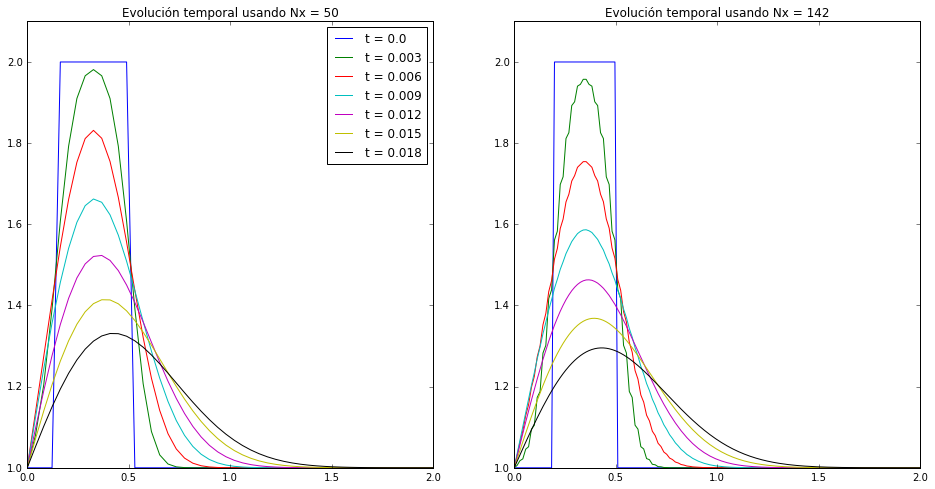

In [16]:
L = 2.          #Longitud de la malla
dt = 0.0001       #Separacion temporal, Delta t
Nx1 = 50
Nx2 = 142
f, (ax, bx) = subplots(1, 2, figsize=(16, 8))

#Condicion inicial primer grafico
dx1 = L/(Nx1-1.)
u01 = ones(Nx1)
u01[int(.2/dx1) : int(0.5/dx1+1.)] = 2

#Condicion inicial segundo grafico
dx2 = L/(Nx2-1.)
u02 = ones(Nx2)
u02[int(.2/dx2) : int(0.5/dx2+1.)] = 2

for nt in range(0, 210, 30):
    ax.plot(linspace(0, L, Nx1), avance_en_tiempo(u01, nt, Nx1, dt, dx1),label=u't = '+str(dt*nt))
    bx.plot(linspace(0, L, Nx2), avance_en_tiempo(u02, nt, Nx2, dt, dx2),label=u't = '+str(dt*nt))

ax.set_title(u"Evolución temporal usando Nx = "+str(Nx1))
bx.set_title(u"Evolución temporal usando Nx = "+str(Nx2))
ax.set_ylim(1.,2.1)
bx.set_ylim(1.,2.1)
ax.legend()

Podemos notar que la solución numética para el caso de $Nx = 142$ empiza a oscilar para los primeros términos, al final la solución numérica se estabiliza y deja de oscilar. Sin embargo este efecto es producido por la inestabilidad del método para los parámetros $\Delta t$ y $\Delta x$ como ya vimos en los notebook's anteriores se necesita imporner un parámetro CFL de forma que en casa paso del método se calcule un $\Delta t$ en función de los parámetros de la ecuación diferencial parcial que se quiere simular.


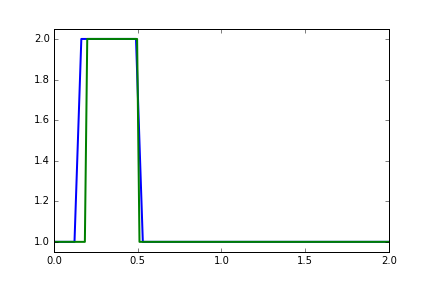
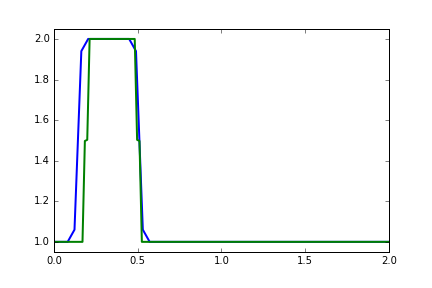
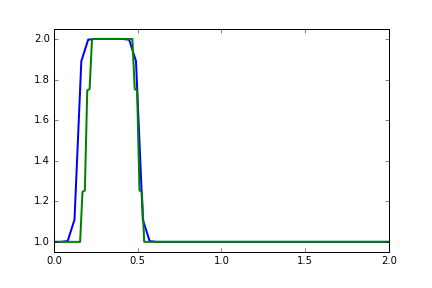
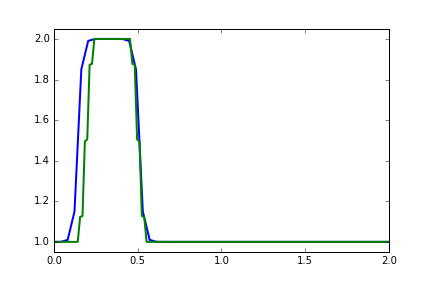
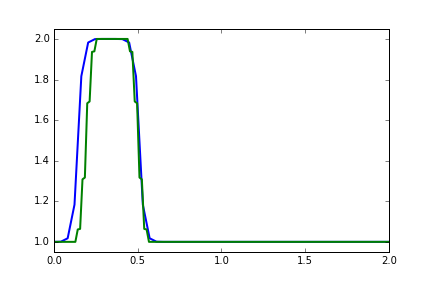
...
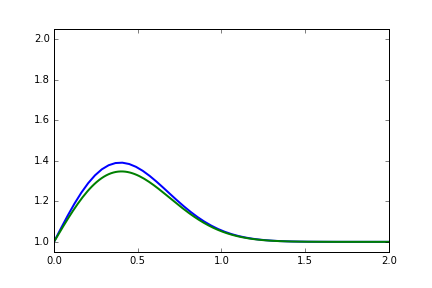
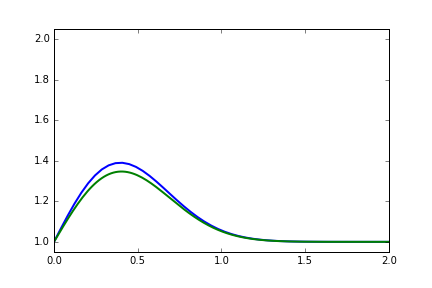
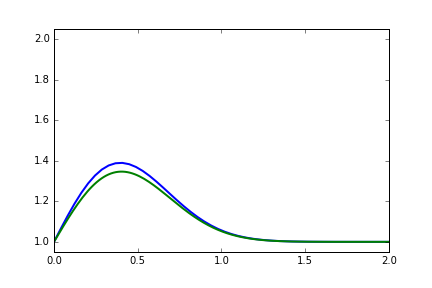
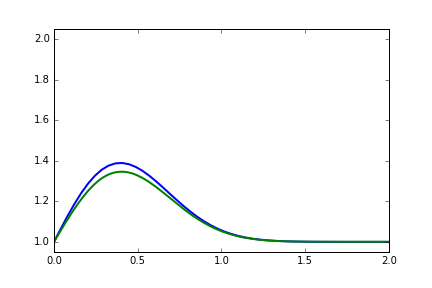
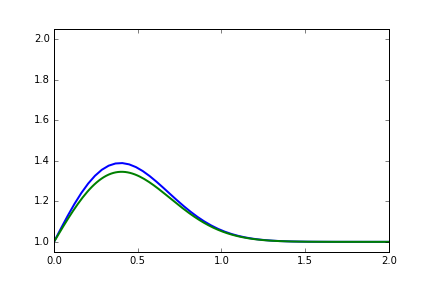

In [13]:
L = 2.          #Longitud de la malla
dt = 0.0001       #Separacion temporal, Delta t
Nx1 = 50
Nx2 = 142

#Condicion inicial primer grafico
dx1 = L/(Nx1-1.)
u01 = ones(Nx1)
u01[int(.2/dx1) : int(0.5/dx1+1.)] = 2

#Condicion inicial segundo grafico
dx2 = L/(Nx2-1.)
u02 = ones(Nx2)
u02[int(.2/dx2) : int(0.5/dx2+1.)] = 2

u1_sol = avance_en_tiempo(u01, 500, Nx1, dt, dx1, True)
u2_sol = avance_en_tiempo(u02, 500, Nx2, dt, dx2, True)

# Se define el ambiente en el que queremos hacer la animación
fig = figure()
ax = axes(xlim=(0, L), ylim=(0.95, 2.05))
linea1, = ax.plot([], [], lw=2)
linea2, = ax.plot([], [], lw=2)
T = 250 # periodo para generar T cuadros

# Funcion para inicializar cada cuadro de la animacion
def init():
    linea1.set_data([], [])
    linea2.set_data([], [])
    return linea1,linea2

# Esta funcion se llama de manera secuencial para cada elemento i.
def animate(i):
    x1 = linspace(0, L, Nx1)
    x2 = linspace(0, L, Nx2)
    y1 = u1_sol[i]
    y2 = u2_sol[i]
    linea1.set_data(x1, y1),linea2.set_data(x2, y2),
    return linea1,linea2,

# Se llama a la animacion.  blit=True es para que solo se dibije las partes de la imagen que tienen cambios.
animation.FuncAnimation(fig, animate, init_func=init, frames=2*T, interval=20, blit=True)

## Caso utilizando el número CFL

En el caso de la difusión en una dimensión para que el método de diferencias finitas sea estable se necesita que se cumple una condición de tipo CFL.

Esta condición se presenta como las desigualdad
$$\sigma = \frac{ \nu \Delta t}{(\Delta x)^2} < \sigma_{max}$$

Por lo tanto $$\Delta t = \frac{\sigma (\Delta x)^2}{\nu} \le \frac{(\Delta x)^2}{\nu}$$

In [26]:
def avance_en_tiempo_CFL(u0, nt, nx, dx, flag=False):
    u = u0
    if flag: hist=[]
    nu = 1
    sigma = 0.2
    dt = sigma*dx**2/nu
    un = ones(nx)
    
    for n in range(nt):
        un = u.copy()
        if flag: hist.append(un)
        for i in range(1,nx-1):
            u[i] = un[i]+nu*dt/dx**2*(un[i+1]-2*un[i]+un[i-1])
    if flag:
        return hist
    else:
        return u

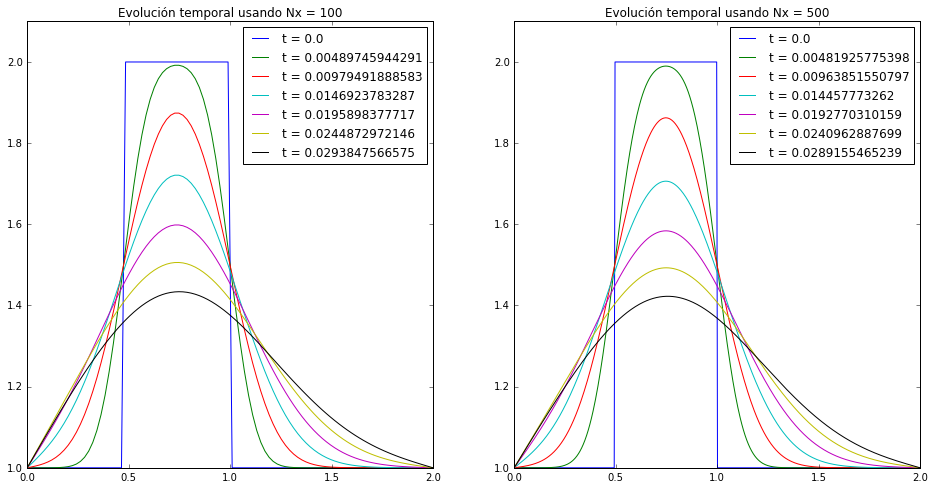

In [24]:
L = 2.          #Longitud de la malla
Nx1 = 100
Nx2 = 500
nu = 1
sigma = 0.2

f, (ax, bx) = subplots(1, 2, figsize=(16, 8))

#Condicion inicial primer grafico
dx1 = L/(Nx1-1.)
u01 = ones(Nx1)
u01[int(.5/dx1) : int(1./dx1+1.)] = 2

#Condicion inicial segundo grafico
dx2 = L/(Nx2-1.)
u02 = ones(Nx2)
u02[int(.5/dx2) : int(1./dx2+1.)] = 2

for nt in range(0, 420, 60):
    ax.plot(linspace(0, L, Nx1), avance_en_tiempo_CFL(u01, nt, Nx1, dx1), label=u't = '+str(nt*sigma*dx1**2/nu))
    
for nt in range(0, 25*420, 25*60):
    bx.plot(linspace(0, L, Nx2), avance_en_tiempo_CFL(u02, nt, Nx2, dx2), label=u't = '+str(nt*sigma*dx2**2/nu))

ax.set_title(u"Evolución temporal usando Nx = "+str(Nx1))
bx.set_title(u"Evolución temporal usando Nx = "+str(Nx2))
ax.set_ylim(1.,2.1)
bx.set_ylim(1.,2.1)
ax.legend()
bx.legend()


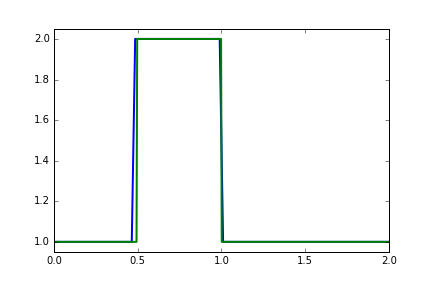
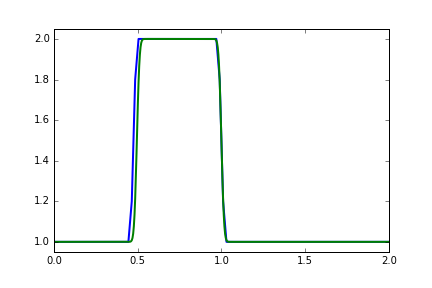
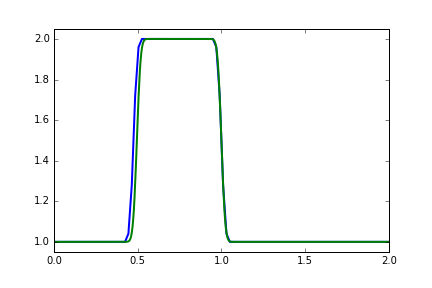
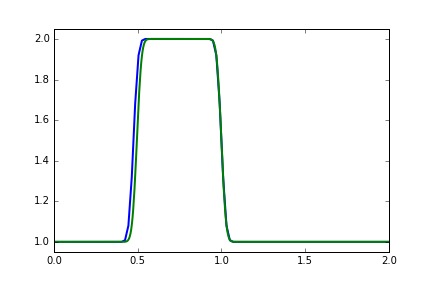
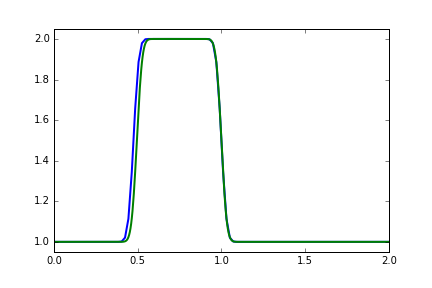
...
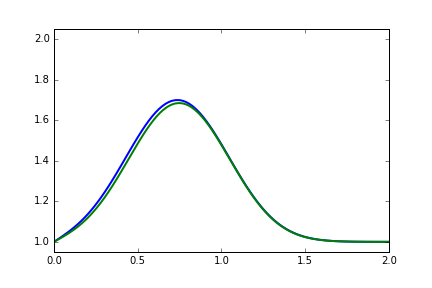
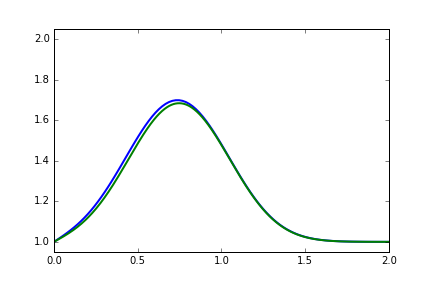
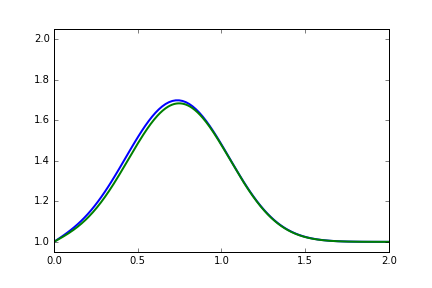
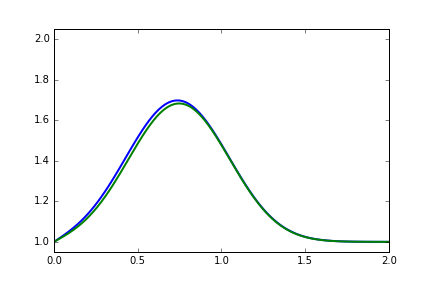
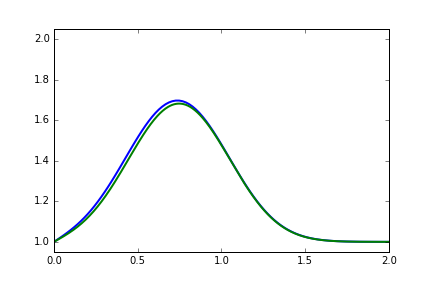

In [29]:
L = 2.          #Longitud de la malla
Nx1 = 100
Nx2 = 500
nu = 1
sigma = 0.2

#Condicion inicial primer grafico
dx1 = L/(Nx1-1.)
u01 = ones(Nx1)
u01[int(.5/dx1) : int(1./dx1+1.)] = 2

#Condicion inicial segundo grafico
dx2 = L/(Nx2-1.)
u02 = ones(Nx2)
u02[int(.5/dx2) : int(1./dx2+1.)] = 2

u1_sol = avance_en_tiempo_CFL(u01, 400, Nx1, dx1, True)
u2_sol = avance_en_tiempo_CFL(u02, 25*400, Nx2, dx2, True)

# Se define el ambiente en el que queremos hacer la animación
fig = figure()
ax = axes(xlim=(0, L), ylim=(0.95, 2.05))
linea1, = ax.plot([], [], lw=2)
linea2, = ax.plot([], [], lw=2)
T = 200 # periodo para generar T cuadros

# Funcion para inicializar cada cuadro de la animacion
def init():
    linea1.set_data([], [])
    linea2.set_data([], [])
    return linea1,linea2

# Esta funcion se llama de manera secuencial para cada elemento i.
def animate(i):
    x1 = linspace(0, L, Nx1)
    x2 = linspace(0, L, Nx2)
    y1 = u1_sol[i]
    y2 = u2_sol[25*i]
    linea1.set_data(x1, y1),linea2.set_data(x2, y2),
    return linea1,linea2,

# Se llama a la animacion.  blit=True es para que solo se dibije las partes de la imagen que tienen cambios.
animation.FuncAnimation(fig, animate, init_func=init, frames=2*T, interval=20, blit=True)